<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc" style="margin-top: 1em;"><ul class="toc-item"><li><span><a href="#Load-the-pretrained-Inception-model" data-toc-modified-id="Load-the-pretrained-Inception-model-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Load the pretrained Inception model</a></span></li><li><span><a href="#Load-Coco-Animals-Dataset" data-toc-modified-id="Load-Coco-Animals-Dataset-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load Coco Animals Dataset</a></span></li><li><span><a href="#Load-ImageNet-dataset-for-labels" data-toc-modified-id="Load-ImageNet-dataset-for-labels-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Load ImageNet dataset for labels</a></span></li><li><span><a href="#define-common-imports-and-variables" data-toc-modified-id="define-common-imports-and-variables-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>define common imports and variables</a></span></li><li><span><a href="#Predict-coco-animals-images-using-Inception-V3" data-toc-modified-id="Predict-coco-animals-images-using-Inception-V3-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Predict coco animals images using Inception V3</a></span></li><li><span><a href="#Predict-coco-animals-images-using-Inception-V3---Preprocessing-in-TF" data-toc-modified-id="Predict-coco-animals-images-using-Inception-V3---Preprocessing-in-TF-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Predict coco animals images using Inception V3 - Preprocessing in TF</a></span></li><li><span><a href="#Predict-coco-animals-images-using-retrained-Inception-V3" data-toc-modified-id="Predict-coco-animals-images-using-retrained-Inception-V3-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Predict coco animals images using retrained Inception V3</a></span></li></ul></div>

# Inception V3 in TensorFlow <a class="tocSkip">

In [1]:
import os

import numpy as np
np.random.seed(123)
print("NumPy:{}".format(np.__version__))

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=15,10
print("Matplotlib:{}".format(mpl.__version__))

import tensorflow as tf
tf.set_random_seed(123)
print("TensorFlow:{}".format(tf.__version__))

from tensorflow.contrib import slim

NumPy:1.13.1
Matplotlib:2.1.0
TensorFlow:1.4.1


In [2]:
DATASETSLIB_HOME = os.path.expanduser('~/dl-ts/datasetslib')
import sys
if not DATASETSLIB_HOME in sys.path:
    sys.path.append(DATASETSLIB_HOME)
%reload_ext autoreload
%autoreload 2
import datasetslib

from datasetslib import util as dsu
datasetslib.datasets_root = os.path.join(os.path.expanduser('~'),'datasets')
models_root = os.path.join(os.path.expanduser('~'),'models')

# Inception V3 Model in TensorFlow

### Load the pretrained Inception model

In [3]:
# load the inception v3 model
model_name='inception_v3'
model_url='http://download.tensorflow.org/models/'
model_files=['inception_v3_2016_08_28.tar.gz']
model_home=os.path.join(models_root,model_name)        
        
dsu.download_dataset(source_url=model_url,
                        source_files=model_files,
                        dest_dir = model_home,
                        force=False,
                        extract=True)

Already exists: /home/armando/models/inception_v3/inception_v3_2016_08_28.tar.gz


['inception_v3_2016_08_28.tar.gz']

In [4]:
# helper function

def disp(images,id2label=None,probs=None,n_top=5,scale=False):
    if scale:
        imgs = (images / 2.0) + 0.5
    else:
        imgs = images

    ids={}
    for j in range(len(images)):
        if scale:
            plt.figure(figsize=(5,5))
            plt.imshow(imgs[j])
        else:
            plt.imshow(imgs[j].astype(np.uint8) )
        plt.show()
        if probs is not None:
            ids[j] = [i[0] for i in sorted(enumerate(-probs[j]), key=lambda x:x[1])]
            for k in range(n_top):
                id = ids[j][k]
                print('Probability {0:1.2f}% of [{1:}]'
                      .format(100*probs[j,id],id2label[id]))

### Load Coco Animals Dataset

In [5]:
# Load the dataset
from datasetslib.coco import coco_animals

coco = coco_animals()
x_train_files, y_train, x_val_files, x_val = coco.load_data()
x_test = [x_val_files[25*x] for x in range(8)]
images_test=np.array([coco.preprocess_for_inception(x) for x in x_test])

Already exists: /home/armando/datasets/coco-animals/coco-animals.zip


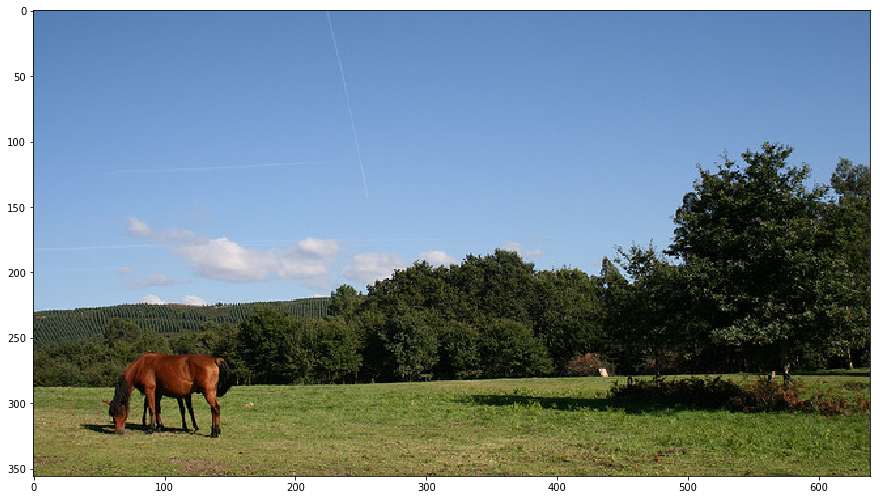

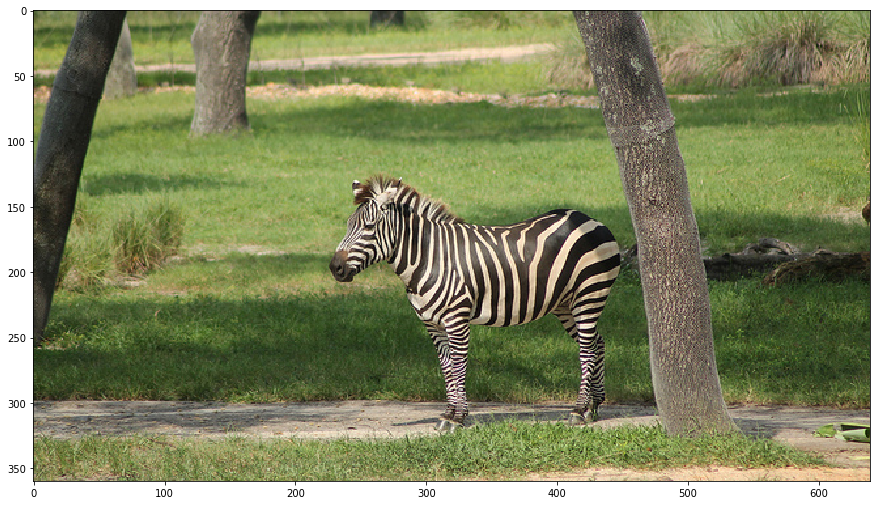

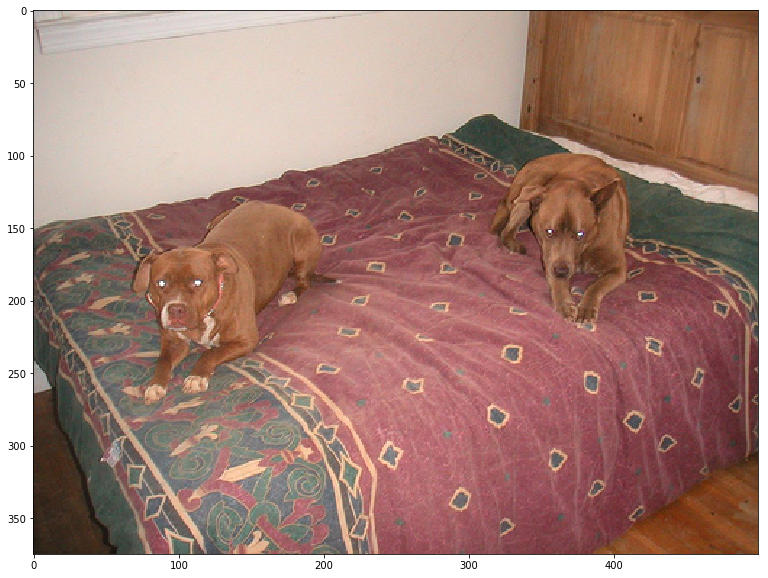

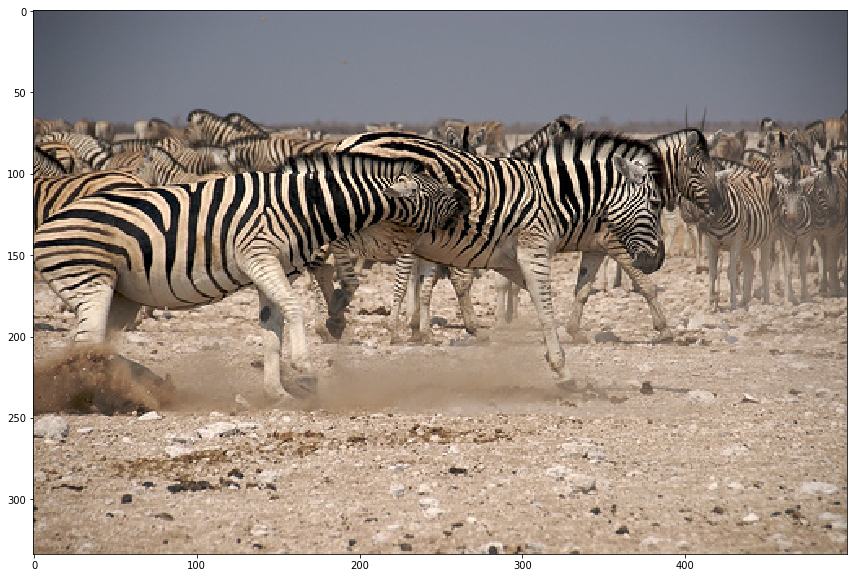

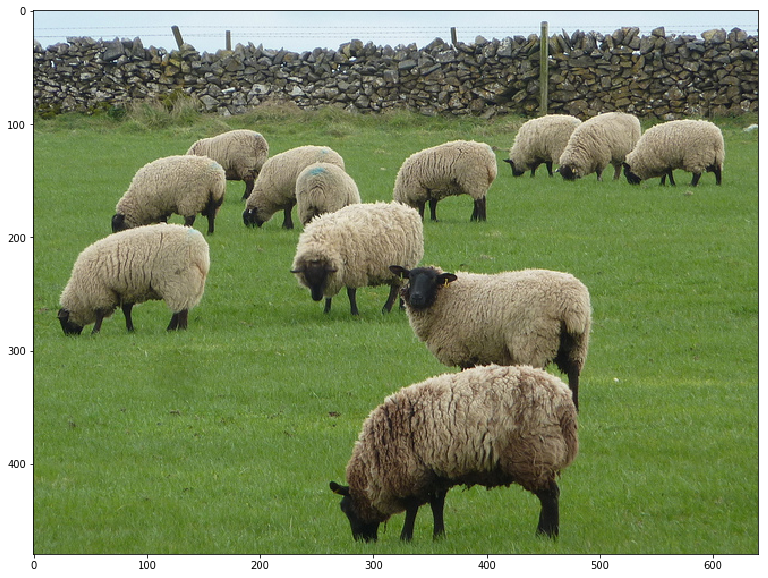

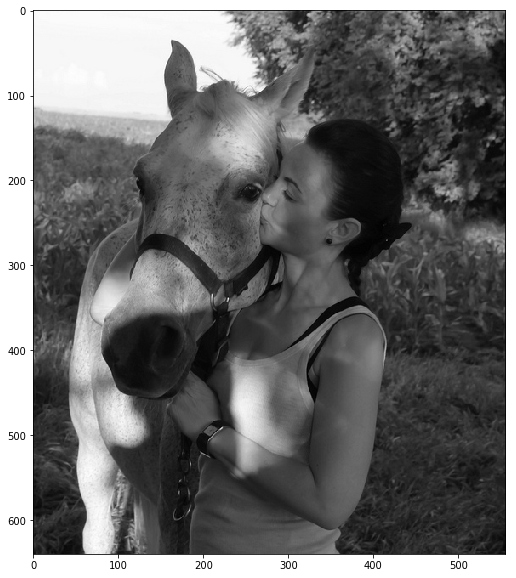

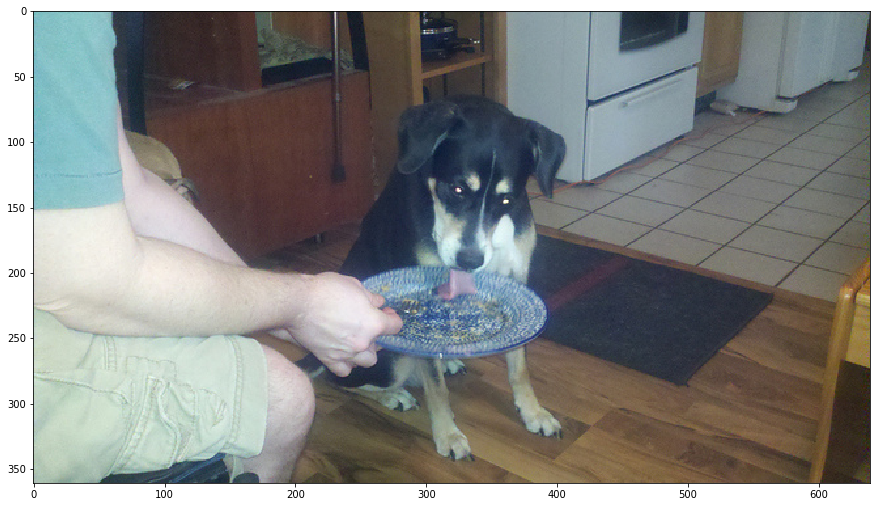

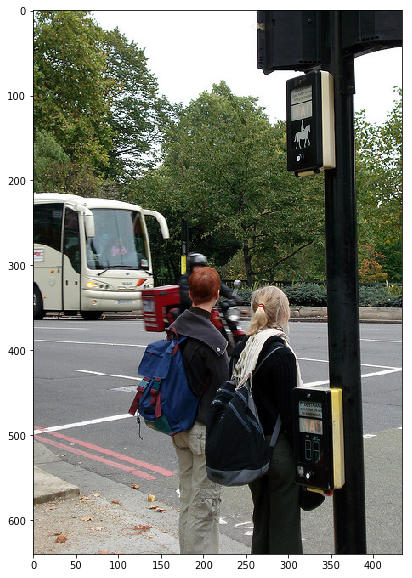

In [6]:
images=np.array([mpimg.imread(x) for x in x_test])

disp(images)

In [7]:
print([x.shape for x in images])

[(356, 640, 3), (360, 640, 3), (375, 500, 3), (334, 500, 3), (480, 640, 3), (640, 556, 3), (361, 640, 3), (640, 434, 3)]


In [8]:
print(images_test.shape)

(8, 299, 299, 3)


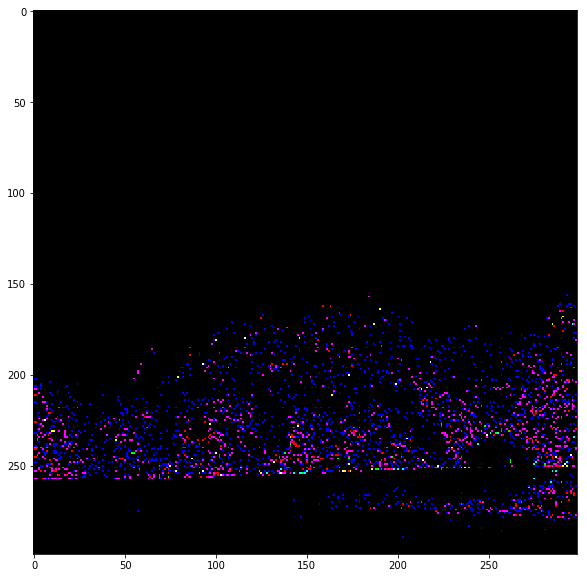

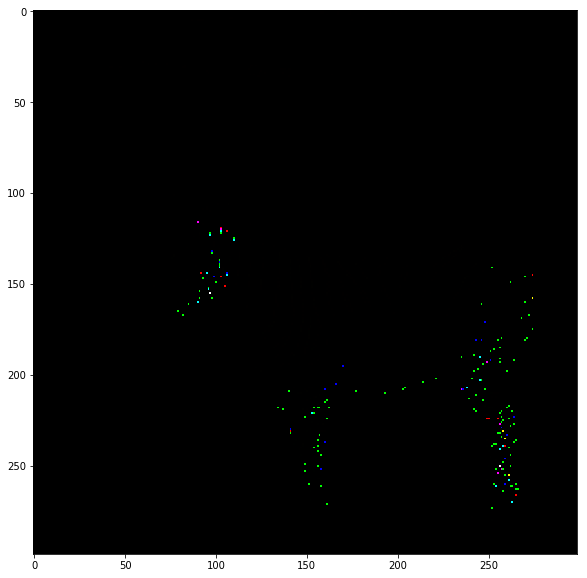

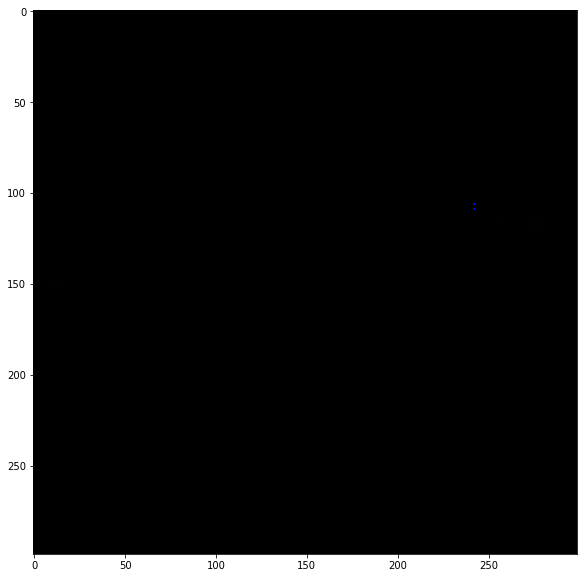

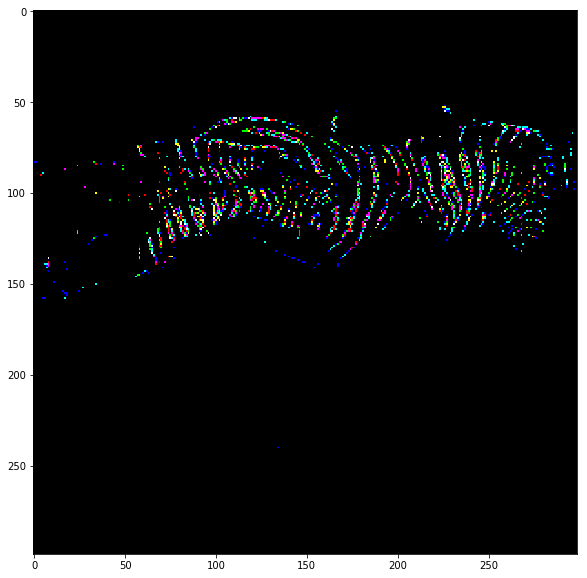

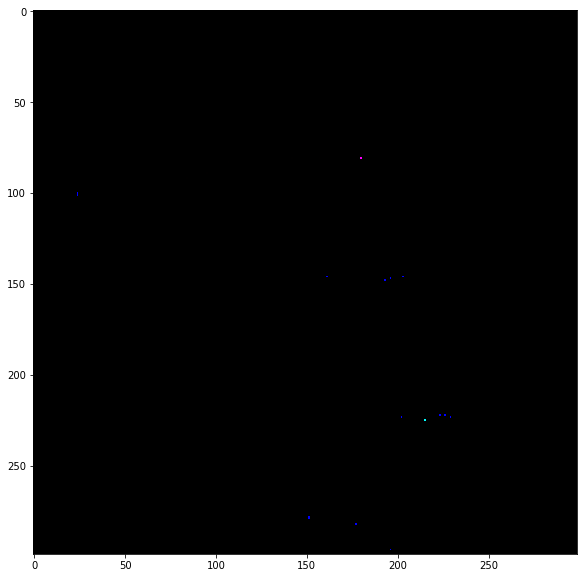

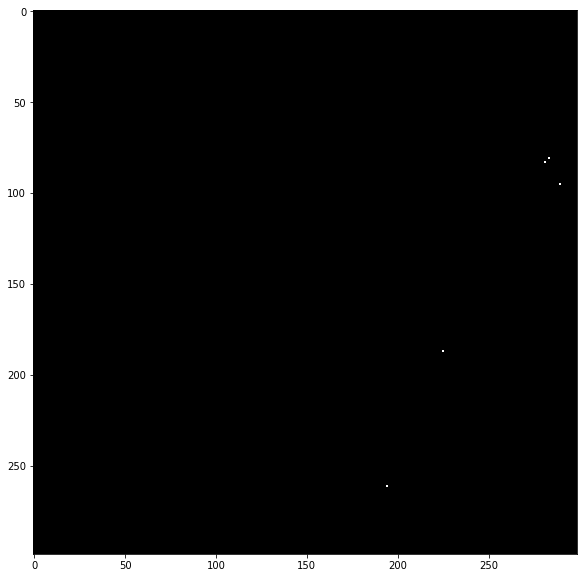

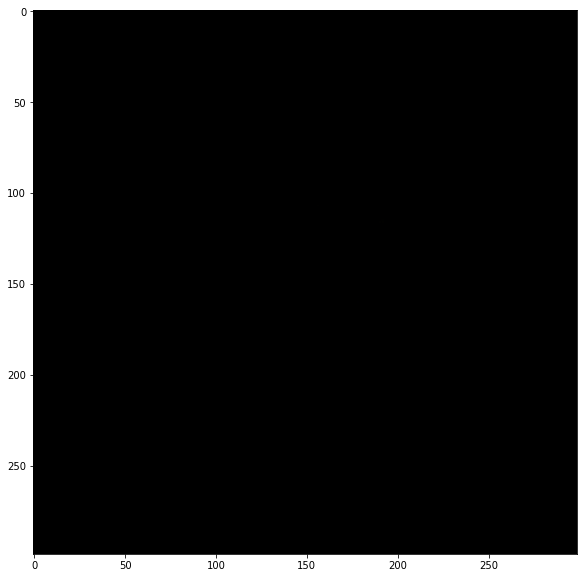

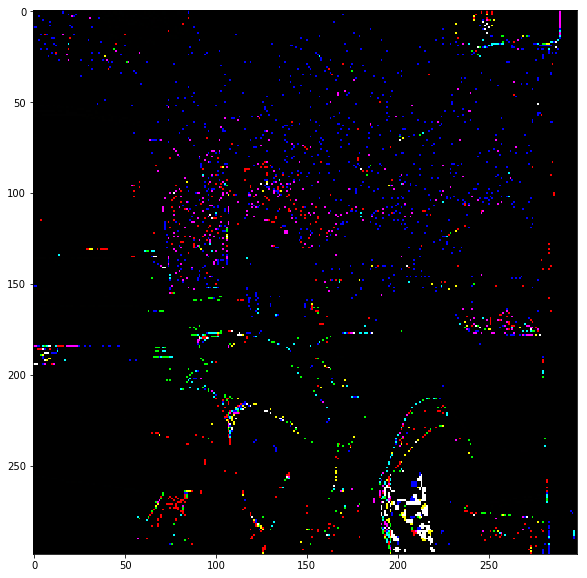

In [9]:
disp(images_test)

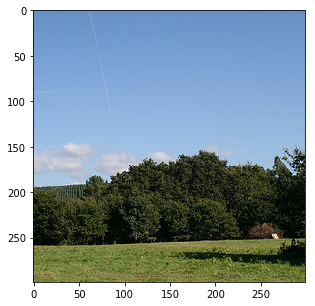

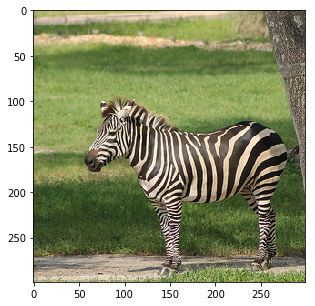

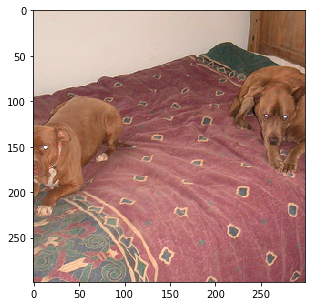

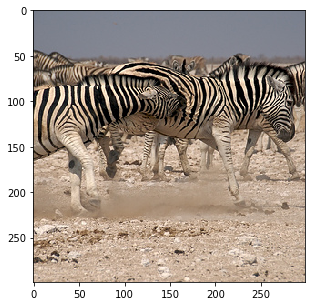

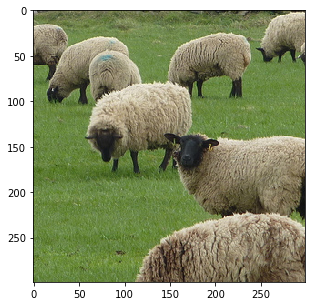

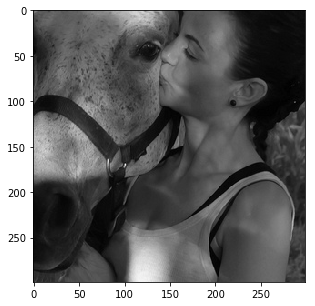

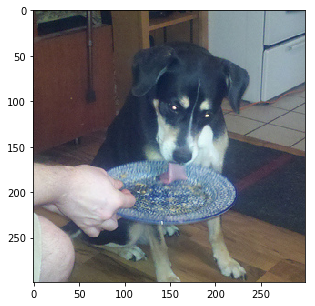

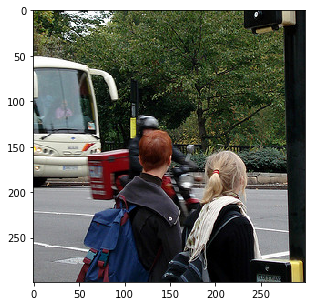

In [10]:
disp(images_test,scale=True)

### Load ImageNet dataset for labels

In [11]:
### Load ImageNet dataset for labels
from datasetslib.imagenet import imageNet
inet = imageNet()
inet.load_data(n_classes=1001)

### define common imports and variables

In [12]:
### define common imports and variables
from tensorflow.contrib.slim.nets import inception
image_height=inception.inception_v3.default_image_size
image_width=inception.inception_v3.default_image_size

### Predict coco animals images using Inception V3

In [13]:
tf.reset_default_graph()

In [14]:
x_p = tf.placeholder(shape=(None,image_height, image_width,3),
                     dtype=tf.float32,
                     name='x_p'
                    )
print(x_p)

Tensor("x_p:0", shape=(?, 299, 299, 3), dtype=float32)


In [15]:
with slim.arg_scope(inception.inception_v3_arg_scope()):
    logits,_ = inception.inception_v3(x_p,
                                      num_classes=inet.n_classes,
                                      is_training=False
                                     )
probabilities = tf.nn.softmax(logits)

init = slim.assign_from_checkpoint_fn(
        os.path.join(model_home, '{}.ckpt'.format(model_name)),
        slim.get_variables_to_restore())

In [16]:
with tf.Session() as tfs:
    init(tfs)
    probs = tfs.run([probabilities],feed_dict={x_p:images_test})
    probs=probs[0]

INFO:tensorflow:Restoring parameters from /home/armando/models/inception_v3/inception_v3.ckpt


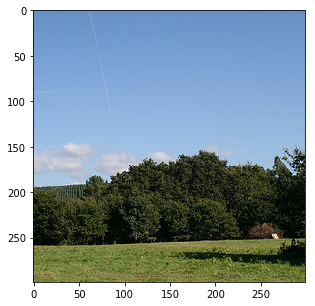

Probability 93.16% of [hay]
Probability 1.31% of [barn]
Probability 0.41% of [rapeseed]
Probability 0.40% of [harvester, reaper]
Probability 0.38% of [worm fence, snake fence, snake-rail fence, Virginia fence]


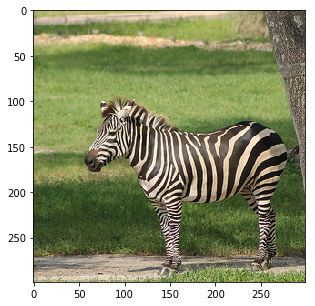

Probability 94.31% of [zebra]
Probability 0.11% of [hartebeest]
Probability 0.07% of [ostrich, Struthio camelus]
Probability 0.05% of [whistle]
Probability 0.04% of [gondola]


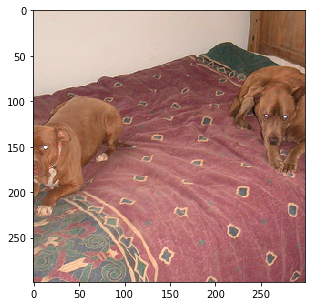

Probability 44.88% of [vizsla, Hungarian pointer]
Probability 32.04% of [Chesapeake Bay retriever]
Probability 13.81% of [redbone]
Probability 5.08% of [Weimaraner]
Probability 0.41% of [quilt, comforter, comfort, puff]


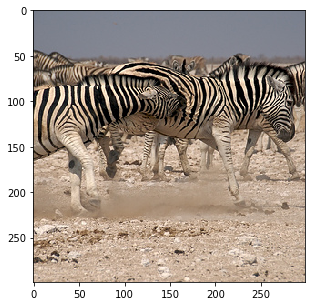

Probability 94.92% of [zebra]
Probability 0.16% of [hartebeest]
Probability 0.09% of [ostrich, Struthio camelus]
Probability 0.06% of [impala, Aepyceros melampus]
Probability 0.04% of [hyena, hyaena]


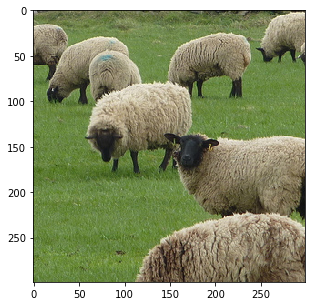

Probability 99.33% of [ram, tup]
Probability 0.12% of [kelpie]
Probability 0.09% of [bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis]
Probability 0.09% of [llama]
Probability 0.02% of [Border collie]


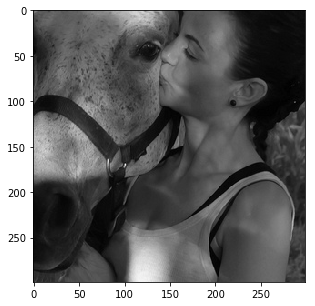

Probability 47.23% of [muzzle]
Probability 6.42% of [oxygen mask]
Probability 6.37% of [llama]
Probability 3.23% of [gasmask, respirator, gas helmet]
Probability 1.76% of [sorrel]


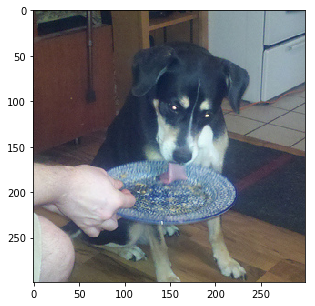

Probability 55.71% of [Appenzeller]
Probability 19.74% of [EntleBucher]
Probability 10.86% of [Greater Swiss Mountain dog]
Probability 3.87% of [beagle]
Probability 0.71% of [bluetick]


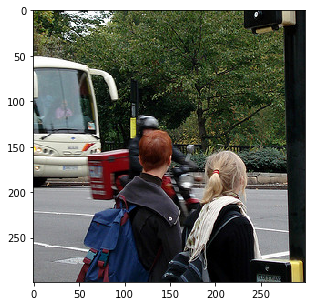

Probability 13.47% of [golfcart, golf cart]
Probability 8.90% of [forklift]
Probability 7.64% of [minibus]
Probability 4.99% of [garbage truck, dustcart]
Probability 4.52% of [trolleybus, trolley coach, trackless trolley]


In [17]:
disp(images_test,id2label=inet.id2label,probs=probs,scale=True)

### Predict coco animals images using Inception V3 - Preprocessing in TF

In [18]:
tf.reset_default_graph()

In [19]:
def tf_preprocess(filelist):
    images=[]
    for filename in filelist:
        image_string = tf.read_file(filename)
        image_decoded = tf.image.decode_jpeg(image_string, channels=3)
        image_float = tf.cast(image_decoded, tf.float32)
        resize_fn = tf.image.resize_image_with_crop_or_pad
        image_resized = resize_fn(image_float, 
                                  image_height, 
                                  image_width
                                 )
        image =  ((image_resized / 255.0) - 0.5) * 2.0
        images.append(image)
        
    images = tf.stack(images)
    return images

In [20]:
images=tf_preprocess([x for x in x_test])
print(images)

Tensor("stack_24:0", shape=(8, 299, 299, 3), dtype=float32)


In [21]:
with slim.arg_scope(inception.inception_v3_arg_scope()):
    logits,_ = inception.inception_v3(images,
                                      num_classes=inet.n_classes,
                                      is_training=False
                                     )
probabilities = tf.nn.softmax(logits)

init = slim.assign_from_checkpoint_fn(
        os.path.join(model_home, '{}.ckpt'.format(model_name)),
        slim.get_variables_to_restore())

In [22]:
with tf.Session() as tfs:
    init(tfs)
    np_images,probs = tfs.run([images,probabilities])

INFO:tensorflow:Restoring parameters from /home/armando/models/inception_v3/inception_v3.ckpt


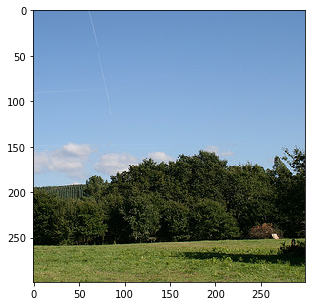

Probability 93.52% of [hay]
Probability 1.09% of [barn]
Probability 0.37% of [rapeseed]
Probability 0.36% of [worm fence, snake fence, snake-rail fence, Virginia fence]
Probability 0.31% of [harvester, reaper]


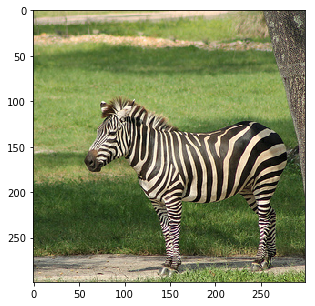

Probability 94.24% of [zebra]
Probability 0.11% of [hartebeest]
Probability 0.07% of [ostrich, Struthio camelus]
Probability 0.05% of [whistle]
Probability 0.04% of [gondola]


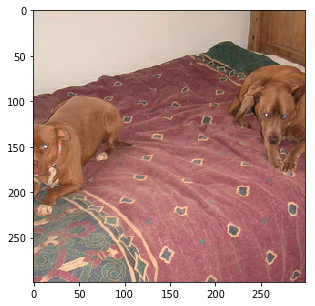

Probability 85.64% of [vizsla, Hungarian pointer]
Probability 7.37% of [redbone]
Probability 3.94% of [Chesapeake Bay retriever]
Probability 1.49% of [Weimaraner]
Probability 0.22% of [Rhodesian ridgeback]


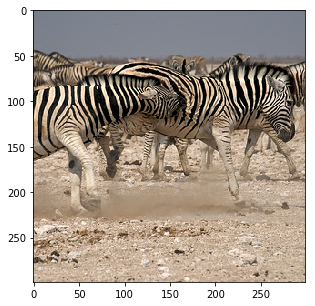

Probability 94.75% of [zebra]
Probability 0.16% of [hartebeest]
Probability 0.10% of [ostrich, Struthio camelus]
Probability 0.06% of [impala, Aepyceros melampus]
Probability 0.04% of [hyena, hyaena]


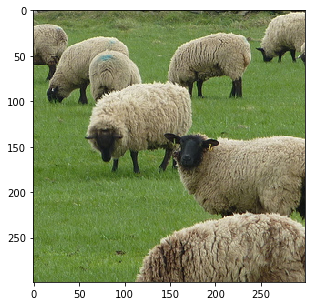

Probability 99.37% of [ram, tup]
Probability 0.12% of [kelpie]
Probability 0.10% of [bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis]
Probability 0.06% of [llama]
Probability 0.02% of [Border collie]


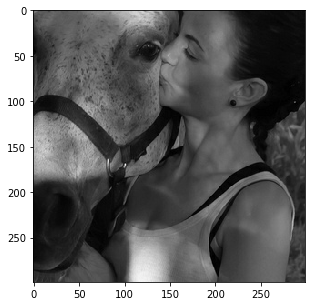

Probability 55.89% of [muzzle]
Probability 5.42% of [llama]
Probability 3.84% of [oxygen mask]
Probability 2.58% of [gasmask, respirator, gas helmet]
Probability 1.78% of [sorrel]


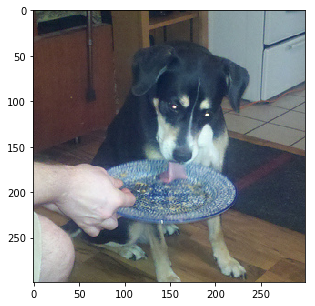

Probability 64.89% of [Appenzeller]
Probability 14.47% of [EntleBucher]
Probability 4.66% of [Greater Swiss Mountain dog]
Probability 2.52% of [beagle]
Probability 1.09% of [kelpie]


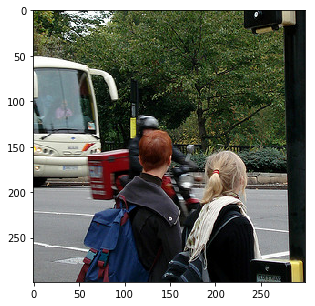

Probability 14.43% of [golfcart, golf cart]
Probability 8.57% of [minibus]
Probability 8.24% of [forklift]
Probability 4.62% of [garbage truck, dustcart]
Probability 4.59% of [trolleybus, trolley coach, trackless trolley]


In [23]:
disp(np_images,id2label=inet.id2label,probs=probs,scale=True)

### Predict coco animals images using retrained Inception V3

In [24]:
tf.reset_default_graph()

In [25]:
is_training = tf.placeholder(tf.bool,name='is_training')
x_p = tf.placeholder(shape=(None,
                            image_height, 
                            image_width,
                            3
                           ),
                     dtype=tf.float32,
                     name='x_p')
y_p = tf.placeholder(shape=(None,coco.n_classes),
                     dtype=tf.int32,
                     name='y_p')

In [26]:
with slim.arg_scope(inception.inception_v3_arg_scope()):
    logits,_ = inception.inception_v3(x_p,
                                      num_classes=coco.n_classes,
                                      is_training=True
                                     )
probabilities = tf.nn.softmax(logits)
    
# restore except last layer
checkpoint_exclude_scopes=["InceptionV3/Logits", "InceptionV3/AuxLogits"]
exclusions = [scope.strip() for scope in checkpoint_exclude_scopes]

variables_to_restore = []
for var in slim.get_model_variables():
    excluded = False
    for exclusion in exclusions:
        if var.op.name.startswith(exclusion):
            excluded = True
            break
    if not excluded:
        variables_to_restore.append(var)

init_fn = slim.assign_from_checkpoint_fn(
    os.path.join(model_home, '{}.ckpt'.format(model_name)),
    variables_to_restore)

In [27]:
tf.losses.softmax_cross_entropy(onehot_labels=y_p, logits=logits)
loss = tf.losses.get_total_loss()

In [28]:
learning_rate = 0.001
optimizer = tf.train.GradientDescentOptimizer(learning_rate = learning_rate)
train_op = optimizer.minimize(loss)    

In [29]:
#y_pred = tf.to_int32(tf.argmax(logits, 1))
#n_correct_pred = tf.equal(y_pred, y_p)
#accuracy = tf.reduce_mean(tf.cast(n_correct_pred, tf.float32))

In [30]:
n_epochs=10
coco.y_onehot = True
coco.batch_size = 32
coco.batch_shuffle = True
total_images = len(x_train_files)
n_batches = total_images // coco.batch_size

with tf.Session() as tfs:
        tfs.run(tf.global_variables_initializer())
        init_fn(tfs)  
        
        for epoch in range(n_epochs):
            print('Starting epoch ',epoch)
            coco.reset_index()
            epoch_accuracy=0
            epoch_loss=0
            for batch in range(n_batches):
                try:
                    x_batch, y_batch = coco.next_batch()
                    images=np.array([coco.preprocess_for_inception(x) for x in x_batch])
                    
                    feed_dict = {x_p: images,y_p: y_batch,is_training: True}
                    batch_loss,_ = tfs.run([loss,train_op], feed_dict = feed_dict)

                    #feed_dict={x_p: images, y_p: y_onehot,is_training: False}
                    #batch_accuracy = tfs.run(accuracy,feed_dict=feed_dict)
                    epoch_loss += batch_loss 
                    #epoch_accuracy += batch_accuracy
                except Exception as ex:
                    print('error in epoch {} batch {}'.format(epoch,batch))
                    print(ex)
            #epoch_accuracy /= n_batches
            epoch_loss /= n_batches
            
            print('Train loss in epoch {}:{}'.format(epoch,epoch_loss))
            
        # now run the predictions
        feed_dict={x_p:images_test,is_training: False}
        probs = tfs.run([probabilities],feed_dict=feed_dict)
        probs=probs[0]

INFO:tensorflow:Restoring parameters from /home/armando/models/inception_v3/inception_v3.ckpt
Starting epoch  0
Train loss in epoch 0:2.518094177246094
Starting epoch  1
Train loss in epoch 1:1.6292894506454467
Starting epoch  2
Train loss in epoch 2:1.171158368587494
Starting epoch  3
Train loss in epoch 3:0.969682149887085
Starting epoch  4
Train loss in epoch 4:0.8514272093772888
Starting epoch  5
Train loss in epoch 5:0.6981807744503021
Starting epoch  6
Train loss in epoch 6:0.6355322015285492
Starting epoch  7
Train loss in epoch 7:0.5994894957542419
Starting epoch  8
Train loss in epoch 8:0.512144820690155
Starting epoch  9
Train loss in epoch 9:0.47834158658981324


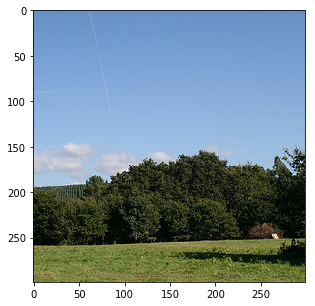

Probability 40.96% of [horse]
Probability 17.42% of [sheep]
Probability 15.19% of [bird]
Probability 14.61% of [bear]
Probability 7.01% of [giraffe]


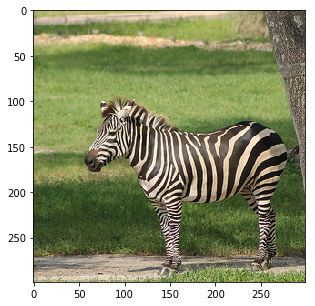

Probability 93.94% of [zebra]
Probability 3.02% of [giraffe]
Probability 1.27% of [sheep]
Probability 1.23% of [bird]
Probability 0.27% of [bear]


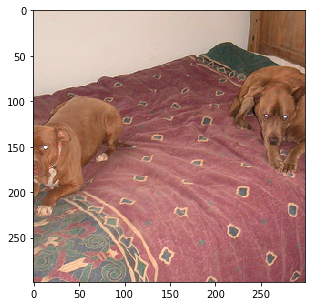

Probability 97.59% of [dog]
Probability 1.14% of [cat]
Probability 0.72% of [giraffe]
Probability 0.24% of [bear]
Probability 0.14% of [sheep]


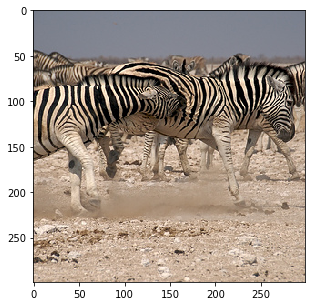

Probability 95.16% of [zebra]
Probability 2.31% of [bird]
Probability 1.51% of [giraffe]
Probability 0.61% of [cat]
Probability 0.17% of [dog]


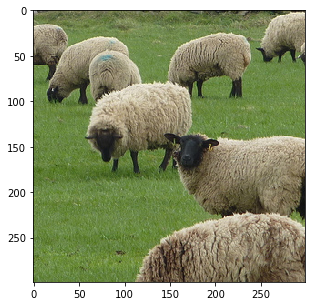

Probability 99.15% of [sheep]
Probability 0.43% of [bear]
Probability 0.30% of [cat]
Probability 0.05% of [horse]
Probability 0.05% of [bird]


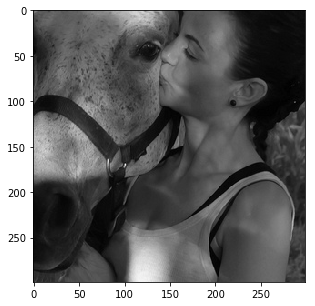

Probability 79.85% of [horse]
Probability 8.83% of [giraffe]
Probability 5.57% of [cat]
Probability 2.16% of [bear]
Probability 1.16% of [sheep]


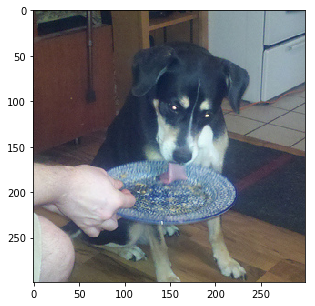

Probability 97.40% of [dog]
Probability 1.36% of [bear]
Probability 0.67% of [cat]
Probability 0.28% of [bird]
Probability 0.23% of [zebra]


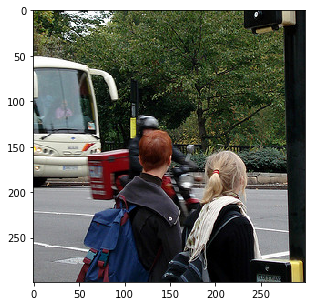

Probability 76.51% of [horse]
Probability 10.57% of [bird]
Probability 5.31% of [dog]
Probability 4.06% of [bear]
Probability 2.54% of [cat]


In [31]:
disp(images_test,id2label=coco.id2label,probs=probs,scale=True)